# Import Libraries

In [1]:
import cv2
import torch
import os
import numpy as np
import pandas as pd
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import torchvision
import shutil
import imageio
import itertools
from IPython import display
from PIL import Image
from glob import glob
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import make_grid, save_image

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

# Load Data

In [3]:
transform = transforms.Compose([
    transforms.Resize(32),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5), std=(0.5))
])

In [4]:
data = torchvision.datasets.MNIST(root='../data/mnist', train=True, download=True, transform=transform)

In [5]:
batch_size = 100
dataloader = DataLoader(data, batch_size=batch_size, shuffle=True)

In [6]:
z_dim = 100
code_dim = 2
image_dim = (1, 32, 32)
num_classes = 10

# Visualization

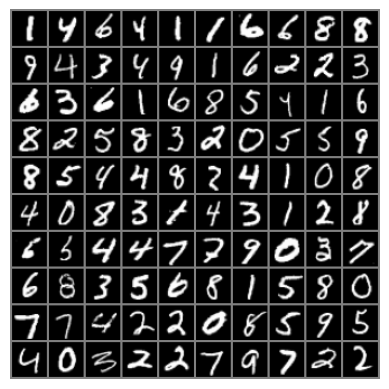

In [7]:
data_iter = iter(dataloader)
images, _ = next(data_iter)

def imshow(img):
    npimg = img.numpy()
    plt.imshow(npimg[0], cmap='gray')
    plt.axis('off')
    plt.show()

imshow(torchvision.utils.make_grid(images, nrow=10))

# Network Initialization

In [8]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

# Generator

In [9]:
class Generator(nn.Module):
    def __init__(self, z_dim, num_classes, code_dim):
        super(Generator, self).__init__()

        self.z_dim = z_dim
        self.num_classes = num_classes
        self.code_dim = code_dim

        input_dim = z_dim + num_classes + code_dim

        self.model = nn.Sequential(
            nn.Linear(input_dim, 128 * 8 ** 2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Unflatten(1, (128, 8, 8)),

            nn.BatchNorm2d(128),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 1, 3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, noise, labels, code):
        gen_input = torch.cat((noise, labels, code), -1)
        img = self.model(gen_input)
        return img

In [10]:
generator = Generator(z_dim=z_dim, num_classes=num_classes, code_dim=code_dim)
generator.to(device)
generator.apply(weights_init_normal)

Generator(
  (model): Sequential(
    (0): Linear(in_features=112, out_features=8192, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Unflatten(dim=1, unflattened_size=(128, 8, 8))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): Upsample(scale_factor=2.0, mode='nearest')
    (5): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Upsample(scale_factor=2.0, mode='nearest')
    (9): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (10): BatchNorm2d(64, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): Conv2d(64, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): Tanh()
  )
)

# Discriminator

In [11]:
class Discriminator(nn.Module):
    def __init__(self, code_dim, num_classes):
        super(Discriminator, self).__init__()

        self.code_dim = code_dim
        self.num_classes = num_classes
        
        self.model = nn.Sequential(
            nn.Conv2d(1, 16, 3, 2, 1), 
            nn.LeakyReLU(0.2, inplace=True), 
            nn.Dropout2d(0.25),

            nn.Conv2d(16, 32, 3, 2, 1),
            nn.BatchNorm2d(32, 0.8), 
            nn.LeakyReLU(0.2, inplace=True), 
            nn.Dropout2d(0.25),

            nn.Conv2d(32, 64, 3, 2, 1),
            nn.BatchNorm2d(64, 0.8), 
            nn.LeakyReLU(0.2, inplace=True), 
            nn.Dropout2d(0.25),

            nn.Conv2d(64, 128, 3, 2, 1),
            nn.BatchNorm2d(128, 0.8), 
            nn.LeakyReLU(0.2, inplace=True), 
            nn.Dropout2d(0.25),
            
            nn.Flatten(),
        )

        self.adversarial_layer = nn.Sequential(nn.Linear(128 * 2 ** 2, 1))
        self.auxiliary_layer = nn.Sequential(nn.Linear(128 * 2 ** 2, num_classes), nn.Softmax(dim=1))
        self.latent_layer = nn.Sequential(nn.Linear(128 * 2 ** 2, code_dim))
        
    def forward(self, img):
        out = self.model(img)
        validity = self.adversarial_layer(out)
        label = self.auxiliary_layer(out)
        latent_code = self.latent_layer(out)

        return validity, label, latent_code

In [12]:
discriminator = Discriminator(code_dim=code_dim, num_classes=num_classes)
discriminator.to(device)
discriminator.apply(weights_init_normal)

Discriminator(
  (model): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Dropout2d(p=0.25, inplace=False)
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(32, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Dropout2d(p=0.25, inplace=False)
    (7): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (8): BatchNorm2d(64, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): Dropout2d(p=0.25, inplace=False)
    (11): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (12): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (13): LeakyReLU(negative_slope=0.2, inplace=True)
    (14): Dropout2d(p=0.25, inplace=False)
    (15): Flatt

# Train

In [13]:
adversarial_loss = nn.MSELoss()
categorical_loss = nn.CrossEntropyLoss()
continuous_loss = nn.MSELoss()

In [14]:
lambda_cat = 1
lambda_con = 0.1

In [15]:
generator_optimizer = optim.Adam(generator.parameters(), lr=0.0001, betas=(0.5, 0.995))
discriminator_optimizer = optim.Adam(discriminator.parameters(), lr=0.0001, betas=(0.5, 0.995))
information_optimizer = optim.Adam(itertools.chain(generator.parameters(), discriminator.parameters()), lr=0.0001, betas=(0.5, 0.995))

In [16]:
n_epochs = 50

In [17]:
os.makedirs('./infogan', exist_ok=True)
os.makedirs('./infogan/static', exist_ok=True)
os.makedirs('./infogan/code1', exist_ok=True)
os.makedirs('./infogan/code2', exist_ok=True)

In [18]:
d_loss_s = []
g_loss_s = []
i_loss_s = []

In [19]:
static_z = torch.zeros((num_classes ** 2, z_dim), device=device)
static_label = F.one_hot(torch.tensor(np.array([num for _ in range(num_classes) for num in range(num_classes)]), dtype=torch.long), num_classes=num_classes).to(device)
static_code = torch.zeros((num_classes ** 2, code_dim), device=device)

In [20]:
for epoch in range(n_epochs):
    for batch_idx, (images, labels) in enumerate(dataloader):
        valid = torch.ones((batch_size, 1), device=device)
        fake = torch.zeros((batch_size, 1), device=device)

        real_images = images.to(device).type(torch.float32)
        labels = F.one_hot(torch.tensor(labels.numpy(), dtype=torch.long), num_classes=num_classes).to(device)

        generator_optimizer.zero_grad()

        z = torch.randn((batch_size, z_dim), device=device)
        label_input = F.one_hot(torch.tensor(np.random.randint(0, num_classes, batch_size), dtype=torch.long), num_classes=num_classes).to(device)
        code_input = torch.rand((batch_size, code_dim), device=device) * 2 - 1

        generated_images = generator(z, label_input, code_input)

        validity, _, _ = discriminator(generated_images)
        g_loss = adversarial_loss(validity, valid)

        g_loss.backward()
        generator_optimizer.step()

        discriminator_optimizer.zero_grad()

        real_pred, _, _ = discriminator(real_images)
        d_real_loss = adversarial_loss(real_pred, valid)

        fake_pred, _, _ = discriminator(generated_images.detach())
        d_fake_loss = adversarial_loss(fake_pred, fake)

        d_loss = (d_real_loss + d_fake_loss) / 2

        d_loss.backward()
        discriminator_optimizer.step()

        information_optimizer.zero_grad()

        sampled_labels = np.random.randint(0, num_classes, batch_size)
        gt_labels = torch.tensor(sampled_labels, device=device, dtype=torch.long)

        z = torch.randn((batch_size, z_dim), device=device)
        label_input = F.one_hot(torch.tensor(sampled_labels, dtype=torch.long), num_classes=num_classes).to(device)
        code_input = torch.rand((batch_size, code_dim), device=device) * 2 - 1 

        generated_images = generator(z, label_input, code_input)
        _, pred_label, pred_code = discriminator(generated_images)

        info_loss = lambda_cat * categorical_loss(pred_label, gt_labels) + lambda_con * continuous_loss(pred_code, code_input)

        info_loss.backward()
        information_optimizer.step()

        if batch_idx % 600 == 0:
            g_loss_s.append(g_loss.item())
            d_loss_s.append(d_loss.item())
            i_loss_s.append(info_loss.item())
            
            print(f"[Epoch {epoch+1}/{n_epochs}] [Batch {batch_idx}/{len(dataloader)}] [D loss: {d_loss:.6f}] [G loss: {g_loss:.6f}] [Information Loss: {info_loss:.6f}]")

            z = torch.randn((10 ** 2, z_dim), device=device)
            static_sample = generator(z, static_label, static_code)
            save_image(static_sample.data, f"infogan/static/{epoch}.png", nrow=10, normalize=True)
        
            zeros = np.zeros((10 ** 2, 1))
            c_varied = np.repeat(np.linspace(-1, 1, 10)[:, np.newaxis], 10, 0)
            c1 = torch.tensor(np.concatenate((c_varied, zeros), -1), dtype=torch.float32, device=device)
            c2 = torch.tensor(np.concatenate((zeros, c_varied), -1), dtype=torch.float32, device=device)
            sample1 = generator(static_z, static_label, c1)
            sample2 = generator(static_z, static_label, c2)
            save_image(sample1.data, f"infogan/code1/{epoch}.png", nrow=10, normalize=True)
            save_image(sample2.data, f"infogan/code2/{epoch}.png", nrow=10, normalize=True)

[Epoch 1/50] [Batch 0/600] [D loss: 0.485066] [G loss: 0.969709] [Information Loss: 2.339053]
[Epoch 2/50] [Batch 0/600] [D loss: 0.217291] [G loss: 0.502448] [Information Loss: 1.625104]
[Epoch 3/50] [Batch 0/600] [D loss: 0.179967] [G loss: 0.453161] [Information Loss: 1.520743]
[Epoch 4/50] [Batch 0/600] [D loss: 0.189871] [G loss: 0.345814] [Information Loss: 1.533905]
[Epoch 5/50] [Batch 0/600] [D loss: 0.193616] [G loss: 0.375433] [Information Loss: 1.490190]
[Epoch 6/50] [Batch 0/600] [D loss: 0.231682] [G loss: 0.380038] [Information Loss: 1.480196]
[Epoch 7/50] [Batch 0/600] [D loss: 0.237712] [G loss: 0.346577] [Information Loss: 1.479246]
[Epoch 8/50] [Batch 0/600] [D loss: 0.247482] [G loss: 0.303922] [Information Loss: 1.490062]
[Epoch 9/50] [Batch 0/600] [D loss: 0.244416] [G loss: 0.328109] [Information Loss: 1.480061]
[Epoch 10/50] [Batch 0/600] [D loss: 0.215676] [G loss: 0.291609] [Information Loss: 1.484591]
[Epoch 11/50] [Batch 0/600] [D loss: 0.219797] [G loss: 0.3

# Results

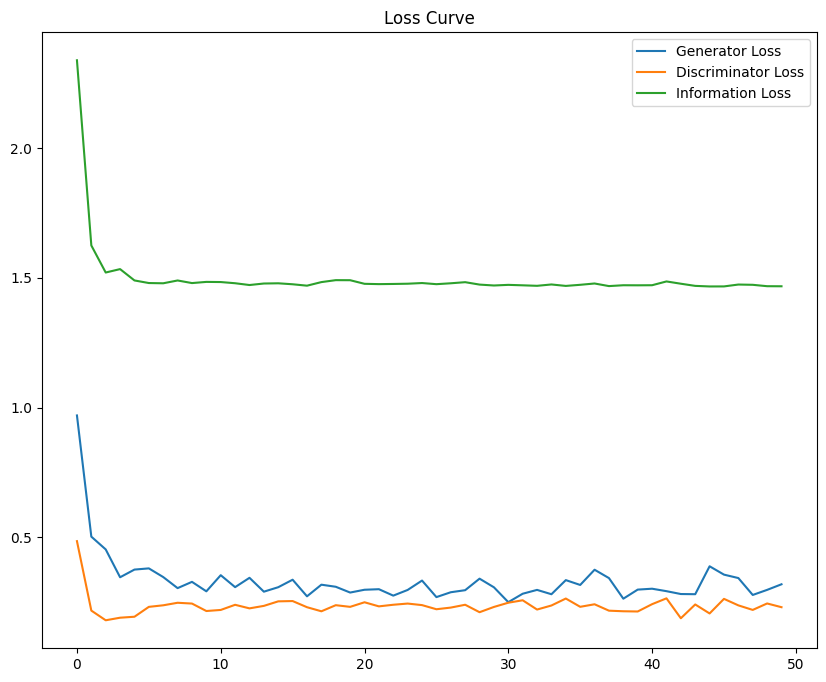

In [21]:
plt.figure(figsize=(10, 8))
plt.plot(g_loss_s)
plt.plot(d_loss_s)
plt.plot(i_loss_s)
plt.title("Loss Curve")
plt.legend(["Generator Loss", "Discriminator Loss", "Information Loss"])
plt.show()

# GIF

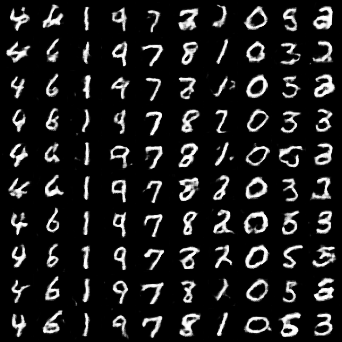

In [25]:
display.Image("./infogan/static/49.png")

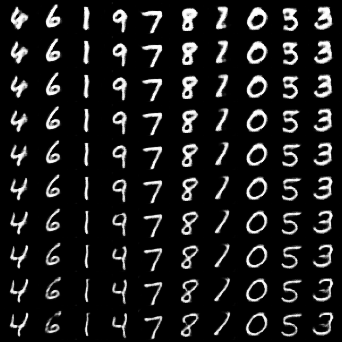

In [26]:
display.Image("./infogan/code1/49.png")

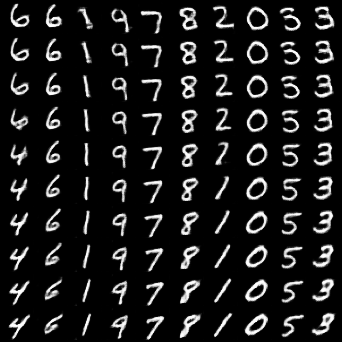

In [27]:
display.Image("./infogan/code2/49.png")

In [28]:
def create_gif(filepath, gif_file):
    files = glob(filepath)
    with imageio.get_writer(gif_file, mode='I') as writer:
        for file in files:
            image = imageio.v2.imread(file)
            writer.append_data(image)

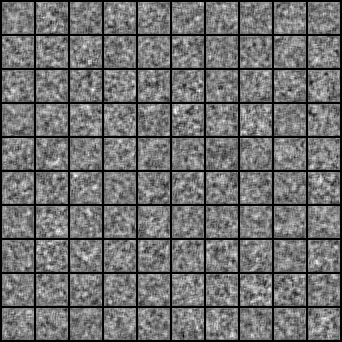

In [29]:
static_images = "./infogan/static/*.png"
static_gif_file = "mnist_infogan_static.gif"
create_gif(static_images, static_gif_file)
display.Image(static_gif_file)

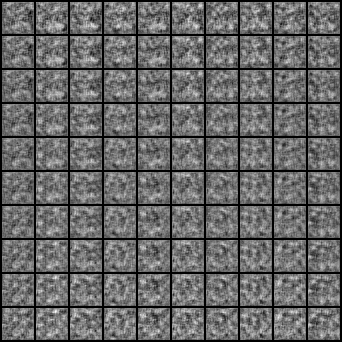

In [30]:
code1_images = "./infogan/code1/*.png"
code1_gif_file = "mnist_infogan_code1.gif"
create_gif(code1_images, code1_gif_file)
display.Image(code1_gif_file)

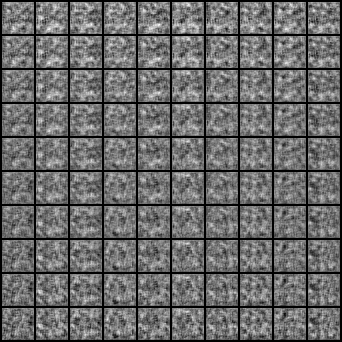

In [31]:
code2_images = "./infogan/code2/*.png"
code2_gif_file = "mnist_infogan_code2.gif"
create_gif(code2_images, code2_gif_file)
display.Image(code2_gif_file)